In [1]:
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from lataq.exp_dict import EXPERIMENT_INFO

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=500)
plt.rcParams['figure.figsize'] = (5, 5)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

%load_ext autoreload
%autoreload 2

In [2]:
PARAMS = {
    'EPOCHS': 50,                                      #TOTAL TRAINING EPOCHS
    'N_PRE_EPOCHS': 40,                                #EPOCHS OF PRETRAINING WITHOUT LANDMARK LOSS
    #'DATA_DIR': '../../lataq_reproduce/data',          #DIRECTORY WHERE THE DATA IS STORED
    #'DATA': 'pancreas',                                #DATA USED FOR THE EXPERIMENT
    'EARLY_STOPPING_KWARGS': {                         #KWARGS FOR EARLY STOPPING
        "early_stopping_metric": "val_landmark_loss",  ####value used for early stopping
        "mode": "min",                                 ####choose if look for min or max
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    'LABELED_LOSS_METRIC': 'dist',           
    'UNLABELED_LOSS_METRIC': 'dist',
    'LATENT_DIM': 50,
    'ALPHA_EPOCH_ANNEAL': 1e3,
    'CLUSTERING_RES': 2,
    'HIDDEN_LAYERS': 4,
    'ETA': 1,
}

In [3]:
adata = sc.read(
    '../data/hlca_counts.h5ad'
)
#adata = adata[:, adata.var.highly_variable].copy()
#adata.X

In [4]:
adata_cancer = sc.read('../data/lambrechts_sub.h5ad')

In [5]:
adata_extended = sc.read('../data/extension_data_pooled_raw_2000genes.h5ad')

In [6]:
adata.var['feature_name'] = adata.var['feature_name'].astype(str)
adata.var = adata.var.set_index('feature_name')

In [7]:
common_vars = adata.var_names.intersection(adata_cancer.var_names).intersection(adata_extended.var_names)

In [8]:
adata = adata[:, common_vars]

In [9]:
adata.write('../data/hlca_counts_commonvars.h5ad')

In [9]:
adata = sc.read('../data/hlca_counts_commonvars.h5ad')

In [10]:
sc.pl.umap(adata, color='ann_finest_level')

In [11]:
adata.obs.groupby('study').size()

study
Banovich_Kropski_2020     121881
Barbry_Leroy_2020          74486
Jain_Misharin_2021         45557
Krasnow_2020               60977
Lafyatis_Rojas_2019        24180
Meyer_2019                 35522
Misharin_2021              64842
Misharin_Budinger_2018     41216
Nawijn_2021                70401
Seibold_2020               33593
Teichmann_Meyer_2019       12229
dtype: int64

In [12]:
adata.obs.groupby('dataset').size()

dataset
Banovich_Kropski_2020        121881
Barbry_Leroy_2020             74486
Jain_Misharin_2021_10Xv1      12422
Jain_Misharin_2021_10Xv2      33135
Krasnow_2020                  60977
Lafyatis_Rojas_2019_10Xv1      2920
Lafyatis_Rojas_2019_10Xv2     21260
Meyer_2019                    35522
Misharin_2021                 64842
Misharin_Budinger_2018        41216
Nawijn_2021                   70401
Seibold_2020_10Xv2            12127
Seibold_2020_10Xv3            21466
Teichmann_Meyer_2019          12229
dtype: int64

In [13]:
condition_key = 'dataset'
cell_type_key = ['ann_finest_level']

In [14]:
lataq_model = EMBEDCVAE(
    adata=adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128]*3,
    latent_dim=50,
    embedding_dim=20,
    inject_condition=['encoder', 'decoder']
)

Embedding dictionary:
 	Num conditions: 14
 	Embedding dim: 20
Encoder Architecture:
	Input Layer in, out and cond: 1897 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 50
Decoder Architecture:
	First Layer in, out and cond:  50 128 20
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 1897 



In [15]:
lataq_model.train(
    n_epochs=50,
    pretraining_epochs=45,
    early_stopping_kwargs=PARAMS['EARLY_STOPPING_KWARGS'],
    alpha_epoch_anneal=PARAMS['ALPHA_EPOCH_ANNEAL'],
    eta=PARAMS['ETA'],
    clustering_res=PARAMS['CLUSTERING_RES'],
    labeled_loss_metric=PARAMS['LABELED_LOSS_METRIC'],
    unlabeled_loss_metric=PARAMS['UNLABELED_LOSS_METRIC'],
    use_stratified_sampling=False,
    best_reload=False
)

loaders init
loaders init done
0.1590893268585205
 |████████████████████| 100.0%  - val_loss: 608.1782795515 - val_trvae_loss: 597.5571984121 - val_landmark_loss: 10.6210811394 - val_labeled_loss: 10.6210811394
Saving best state of network...
Best State was in Epoch 49


In [16]:
lataq_model.save('hlca_core_dataset/', overwrite=True)

In [17]:
lataq_model = EMBEDCVAE.load(
    'hlca_core_dataset/',
    adata
)

AnnData object with n_obs × n_vars = 584884 × 1897
    obs: 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'sample', 'study', 'subject_ID', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'size_factors', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_

In [18]:
lataq_model.model.cuda()

EmbedCVAE(
  (embedding): Embedding(14, 20, max_norm=1)
  (encoder): Encoder(
    (FC): Sequential(
      (L0): CondLayers(
        (expr_L): Linear(in_features=1897, out_features=128, bias=True)
        (cond_L): Linear(in_features=20, out_features=128, bias=False)
      )
      (N0): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A0): ReLU()
      (D0): Dropout(p=0.05, inplace=False)
      (L1): Linear(in_features=128, out_features=128, bias=True)
      (N1): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A1): ReLU()
      (D1): Dropout(p=0.05, inplace=False)
      (L2): Linear(in_features=128, out_features=128, bias=True)
      (N2): LayerNorm((128,), eps=1e-05, elementwise_affine=False)
      (A2): ReLU()
      (D2): Dropout(p=0.05, inplace=False)
    )
    (mean_encoder): Linear(in_features=128, out_features=50, bias=True)
    (log_var_encoder): Linear(in_features=128, out_features=50, bias=True)
  )
  (decoder): Decoder(
    (FirstL): Sequential(
   

In [19]:
data_latent = lataq_model.get_latent(
    adata.X.A.astype('float32'), 
    adata.obs[condition_key].values,
    mean=True,
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata.obs.copy()
#sc.pp.neighbors(adata_latent, n_neighbors=15)
#sc.tl.umap(adata_latent)

In [20]:
adata_latent.write('hlca_core_integrated_dataset.h5ad')

In [21]:
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=5, kernel='linear')
emb_pca = pca.fit_transform(embedding)

In [22]:
def embedding_plot(lataq_model, emb_pca, adata, components, key):
    cond = (
        adata
        .obs
        .groupby(condition_key)
        .first()
        .reindex(lataq_model.conditions_)
        [key]
    )
    patient_id = lataq_model.conditions_

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    import seaborn as sns
    sns.scatterplot(
        emb_pca[:, components[0]], 
        emb_pca[:, components[1]], 
        cond,
        #hue_order = cond_to_keep,
        #palette = 'Reds',
        ax=ax
    )

    for i in range(emb_pca.shape[0]):
        ax.text(
            x=emb_pca[i, components[0]]+0.01,
            y=emb_pca[i, components[1]]+0.01,
            s=patient_id[i],
            fontsize=5
        )
    ax.grid(False)
    ax.set_title('Patient embeddings')
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.despine()
    #ig.savefig('../figures/haniffa_embeddings_query.png', dpi=600, bbox_inches='tight')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


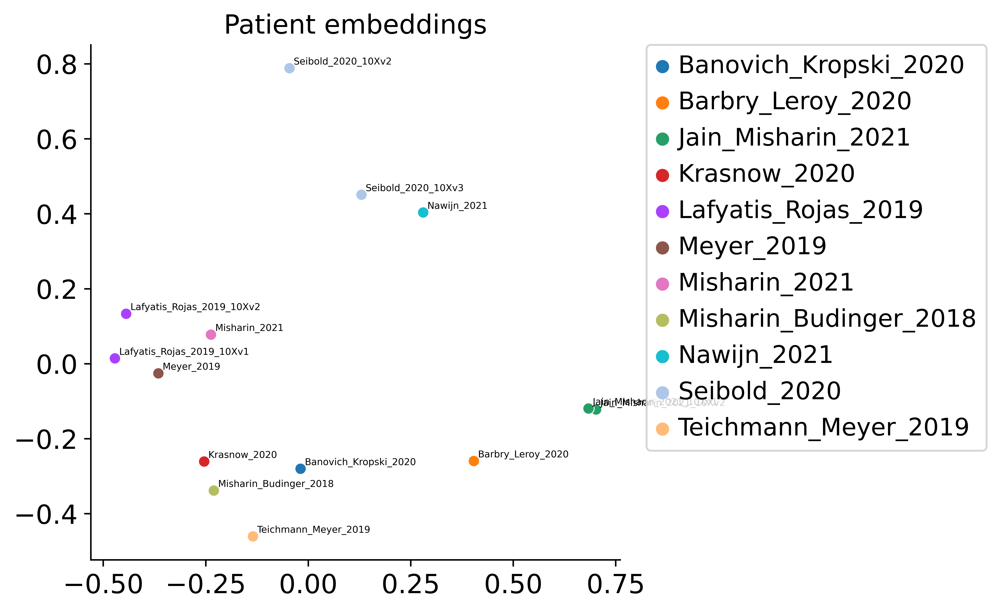

In [23]:
embedding_plot(lataq_model, emb_pca, adata, [0, 1], 'study')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


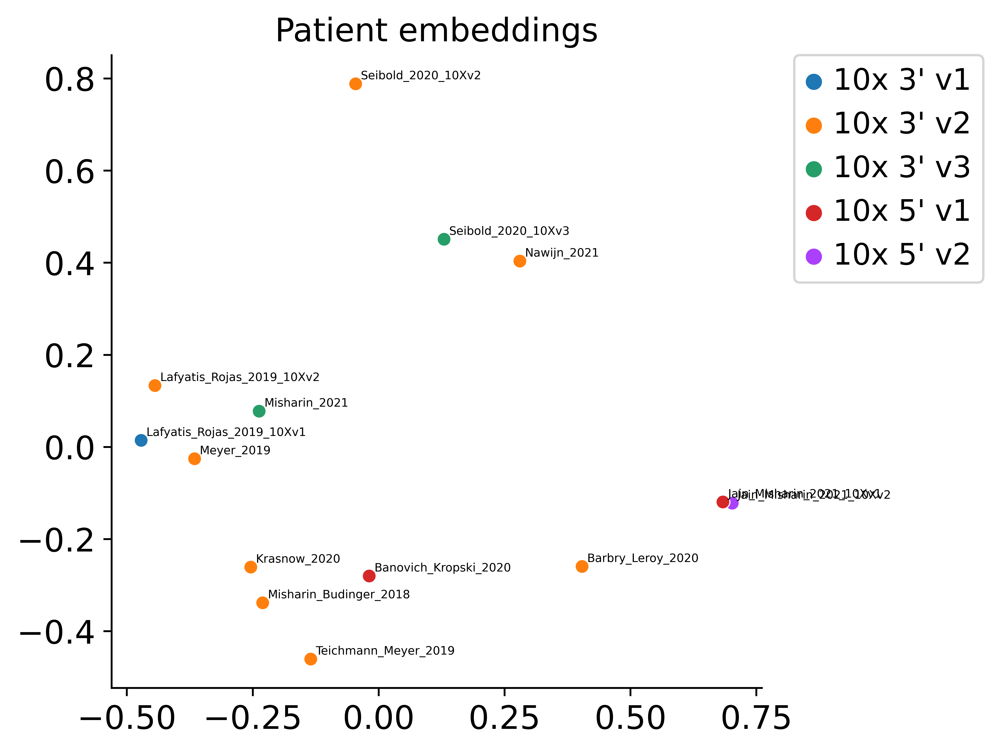

In [24]:
embedding_plot(lataq_model, emb_pca, adata, [0, 1], 'assay')